# define fidicual communities
Communities mostly participate in a combination of CRS activites, and not a single CRS activity Hence it's difficult to rigorously answer the question "which activity will have the most impact for a community that is not doing any CRS activity?". 

Instead we ask a better defined question, for a fiducial community within in the data set, which CRS activity has the most impact? 

In [1]:
import os
import numpy as np 
from astropy.table import join as aJ
from astropy.table import Table as aT

In [2]:
import corner as DFM
# --- plotting ---
import matplotlib as mpl
import matplotlib.pyplot as plt
mpl.rcParams['text.usetex'] = True
mpl.rcParams['font.family'] = 'serif'
mpl.rcParams['axes.linewidth'] = 1.5
mpl.rcParams['axes.xmargin'] = 1
mpl.rcParams['xtick.labelsize'] = 'x-large'
mpl.rcParams['xtick.major.size'] = 5
mpl.rcParams['xtick.major.width'] = 1.5
mpl.rcParams['ytick.labelsize'] = 'x-large'
mpl.rcParams['ytick.major.size'] = 5
mpl.rcParams['ytick.major.width'] = 1.5
mpl.rcParams['legend.frameon'] = False

## load compiled NOAH2 dataset

In [3]:
dat_dir = '/Users/chahah/data/noah/noah2'
fema = aT.read(os.path.join(dat_dir, 'noah2.participants.v0.0.csv'))

In [4]:
activities = [] 
for col in fema.colnames: 
    if 's_c' in col and '_avg' not in col:
        activities.append(col[2:])

In [5]:
columns = ['amountPaidOnTotalClaim_per_policy', 'mean_rainfall', 'avg_risk_score_all', 
           'median_household_income', 'population', 'renter_fraction', 'educated_fraction', 'white_fraction'] 
labels = ['claim per policy', 'rainfall', 'flood risk', 'income', 
          'population', 'renter fraction', 'educated fraction', 'white fraction']

## lets pick the fiducial communities

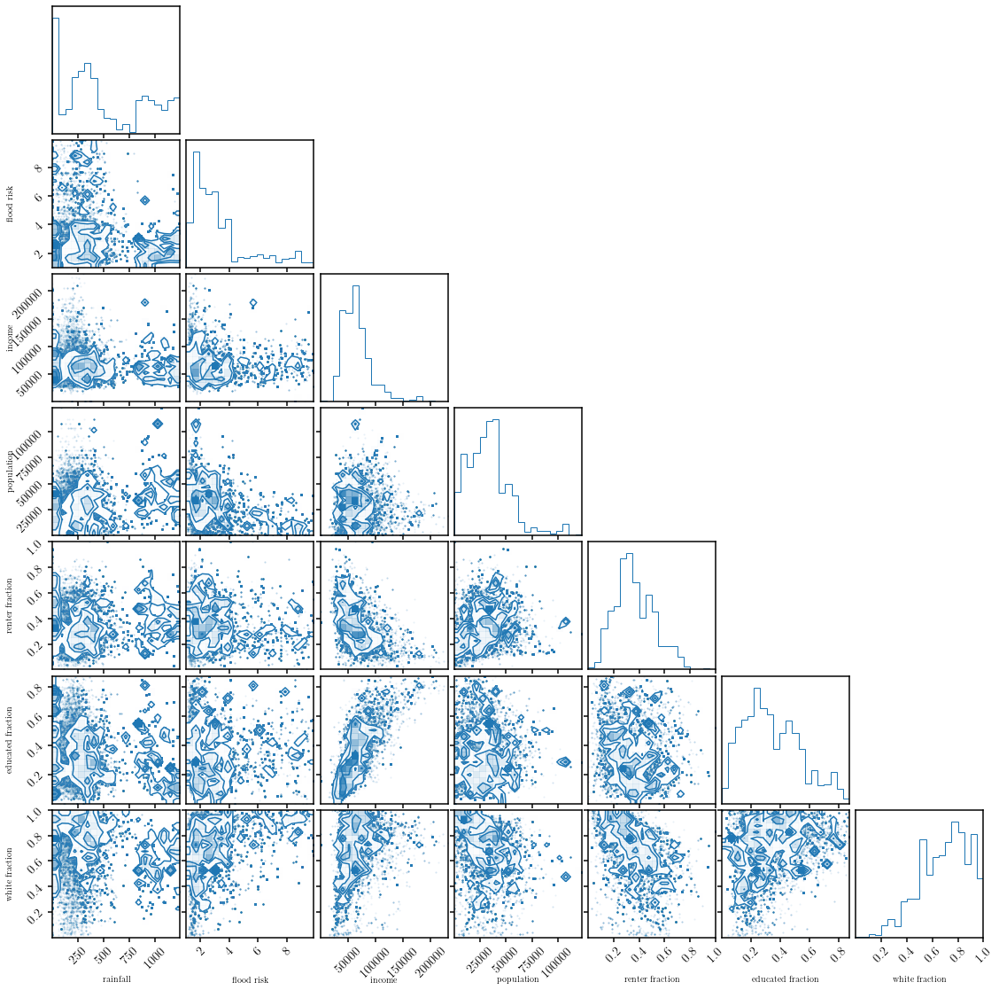

In [6]:
_data = np.array([np.array(fema[col]) for col in columns[1:]])
fig = DFM.corner(_data.T, color='C0', labels=labels[1:])

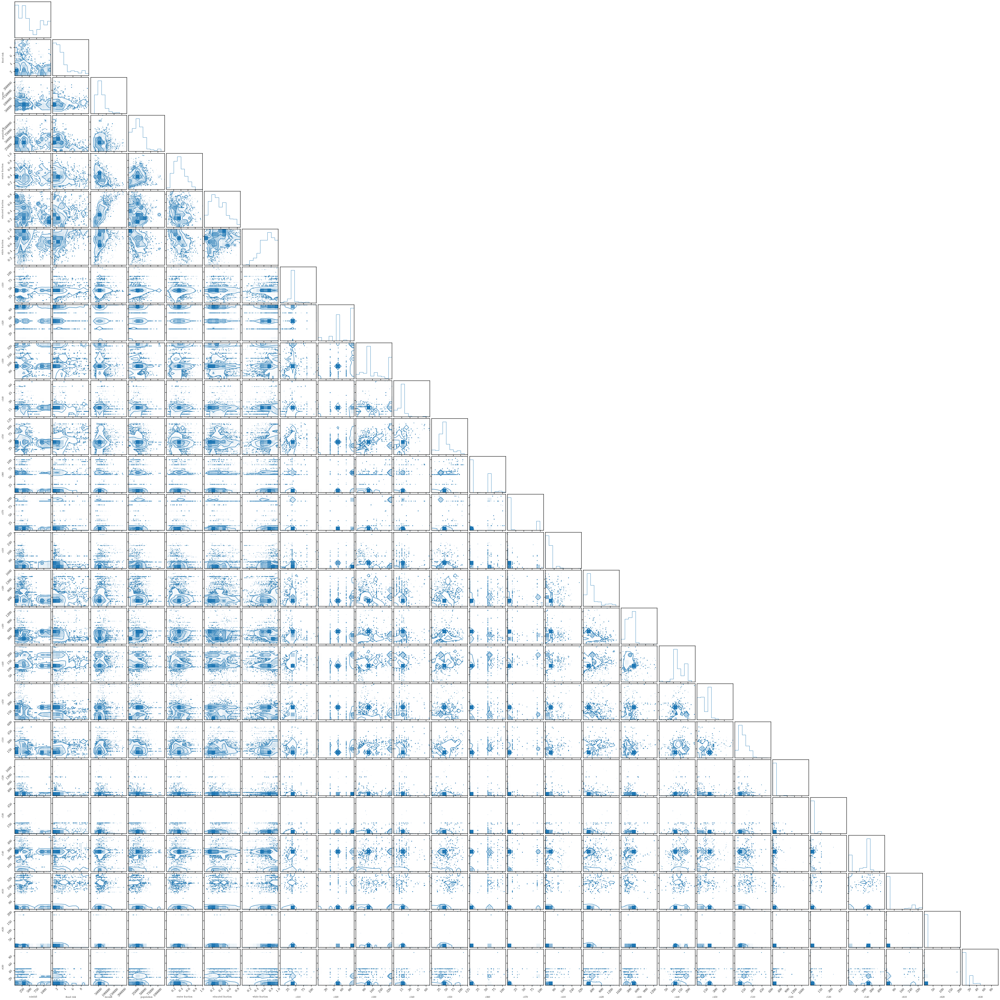

In [8]:
_data = np.array([np.array(fema[col]) for col in (columns[1:] + activities)])
fig = DFM.corner(_data.T, bins=10, color='C0', labels=labels[1:] + activities)

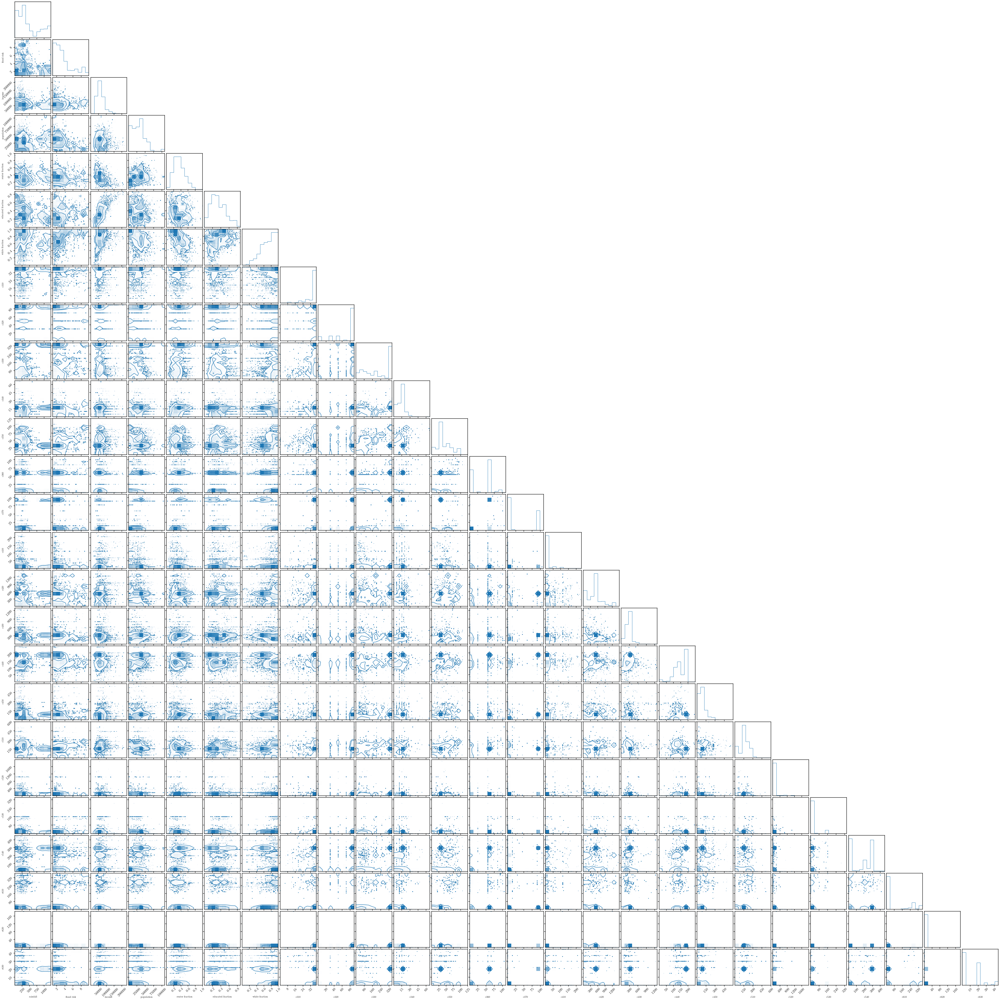

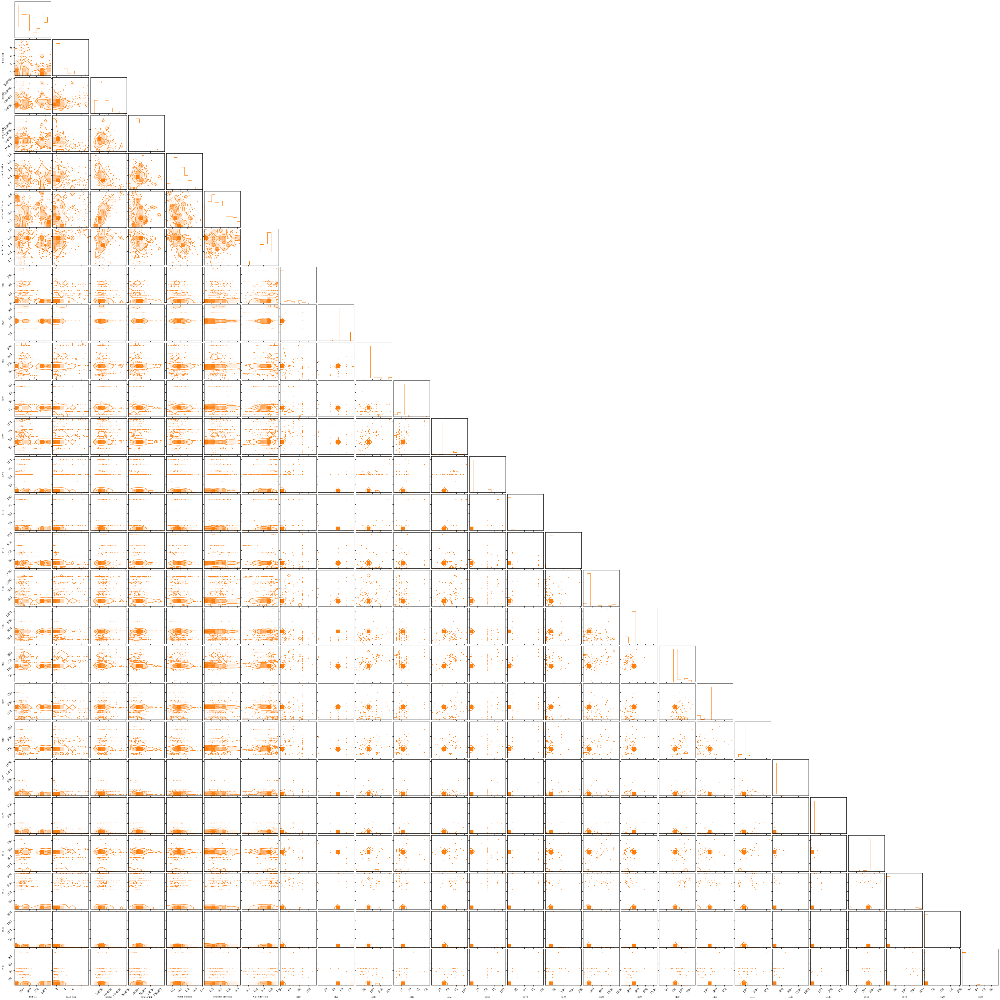

ValueError: It looks like the parameter(s) in column(s) 24 have no dynamic range. Please provide a `range` argument.

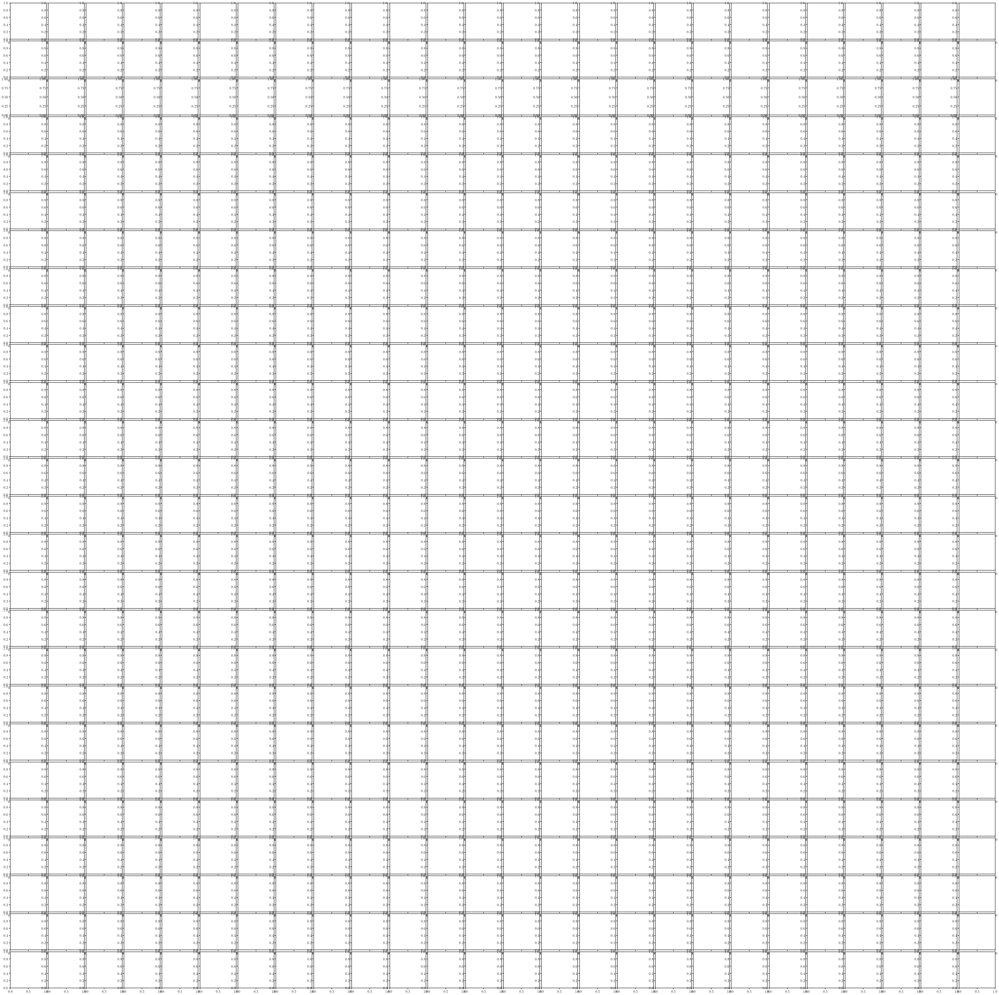

In [10]:
_data = np.array([np.array(fema[col]) for col in (columns[1:] + activities)])

for activity in activities: 
    act_cut = np.median(fema[activity])
    treat = (fema[activity] > act_cut)
    contr = ~treat

    fig = DFM.corner(_data.T[contr], bins=10, color='C0', labels=labels[1:] + activities)
    fig = DFM.corner(_data.T[treat], bins=10, color='C1', labels=labels[1:] + activities)
    plt.show()